In [2]:
import numpy as np
import scipy
import sklearn
from sklearn.decomposition import NMF
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture,BayesianGaussianMixture

import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
mpl.rcParams['image.cmap'] = 'Greys'
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False



import sys,os,pdb,copy,pickle
from importlib import reload
# import pynapple as nap

sys.path.append('/mnt/home/szheng/projects/seq_detection2/code')
sys.path.append('/mnt/home/szheng/projects/util_code')
sys.path.append('/mnt/home/szheng/projects/nmf_analysis')
sys.path.append('/mnt/home/szheng/projects/nmf_analysis/scripts')
sys.path.append('/mnt/home/szheng/projects/cluster_spikes')
sys.path.append('/mnt/home/szheng/projects/place_variability/code')
import data_prep_new as dpn
import place_cell_analysis as pa
import plot_helper as ph
import preprocess as prep
import nmf_analysis as na
import nmf_plot as nmfp
reload(na)

import raster_new as rn
import data_prep_pyn as dpp


import change_point_analysis as cpa
import change_point_plot as cpp

import place_field_analysis as pf

import switch_analysis_one_session as saos
reload(saos)

import process_central_arm as pca 
import change_point_analysis_central_arm_seperate as cpacas

import misc
reload(misc)
from misc import get_nth_key, get_nth_val

67 sessions!
67 sessions!


In [3]:
import matplotlib
matplotlib.rcParams['svg.fonttype'] = 'none'

In [4]:

figdir = '/mnt/home/szheng/ceph/place_variability/fig/paper/suppfigure_switch_rate_lightresponsive'
misc.get_or_create_subdir(figdir)
data_dir = '/mnt/home/szheng/ceph/place_variability/data/paper'
misc.get_or_create_subdir(data_dir)


/mnt/home/szheng/ceph/place_variability/fig/paper/suppfigure_switch_rate_lightresponsive
/mnt/home/szheng/ceph/place_variability/data/paper


'/mnt/home/szheng/ceph/place_variability/data/paper'

In [5]:
import database
db = database.db

subdb = db.query('owner=="roman"').sort_values('n_pyr_putative',ascending=False)
subdb = subdb.query('ntrials>=20&n_neurons>=50')
to_exclude_sess = ['e16_3m2_211211']
subdb=subdb.loc[~subdb['sess_name'].isin(to_exclude_sess)]


import pf_recombine_central as pfrc
import fr_map_one_session as fmos
import switch_detection_one_session as sdos
import get_all_switch_add_metrics as gasam

import preprocess_one_session as prepos

/mnt/home/szheng/ceph/envs/jax/lib/python3.9/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.5.2, the latest is 0.5.4.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


In [6]:
fn = 'prepped_data_agg.p'
fn_full = os.path.join(data_dir,fn)
prepped_data_agg = pickle.load(open(fn_full,'rb'))

all_fields_recombined_all = prepped_data_agg['all_fields_recombined_all']
pf_params_recombined_all=  prepped_data_agg['pf_params_recombined_all']
fr_map_trial_df_all= prepped_data_agg['fr_map_trial_df_all']
occu_map_all = prepped_data_agg['occu_map_all']
fr_map_all = prepped_data_agg['fr_map_all']

pval_all = prepped_data_agg['pval_all']
X_pwc_all = prepped_data_agg['X_pwc_all']
X_raw_all = prepped_data_agg['X_raw_all']
changes_df_all = prepped_data_agg['changes_df_all']
var_res_all_test = prepped_data_agg['var_res_all']
# corr_all = prepped_data_agg['corr_all']
all_sw_d_all = prepped_data_agg['all_sw_d_all']
all_sw_with_metrics_d_all = prepped_data_agg['all_sw_with_metrics_d_all']
best_n_all_test = prepped_data_agg['best_n_all']
spk_beh_df_all = prepped_data_agg['spk_beh_df_all']

# pf_params_all = prepped_data_agg['pf_params_all']
# all_fields_all = prepped_data_agg['all_fields_all']

ntrials_per_tt=fr_map_trial_df_all.groupby(level=(0,1,2,3)).apply(lambda x:x.dropna(axis=1,how='all').shape[1])
ntrials_mask = ntrials_per_tt.groupby(level=(0,1,2)).apply(lambda x:(x>=7).all()) 



In [7]:
savefn_full = os.path.join(data_dir,'per_field_metrics_shtest_with_1cp.p')
# pickle.dump(per_field_metrics_all,open(savefn_full,'wb'))
per_field_metrics_all=pickle.load(open(savefn_full,'rb'))

# get light responsive 

In [8]:
import tqdm

In [24]:
# %%time
# # load cell metrics and save to python
# import pickle
# import tqdm
# for _,row in tqdm.tqdm(subdb.iterrows(),total=subdb.shape[0]):
#     ani,sess=row['animal_name.1'],row['sess_name']
#     ddf = row['data_dir_full']
#     data_fn = f'{sess}.cell_metrics.cellinfo.mat'
#     data = dpn.loadmat(os.path.join(ddf,data_fn))['cell_metrics']

#     py_name = os.path.join(ddf,'py_data',f'{sess}.cell_metrics.p')
#     pickle.dump(data,open(py_name,'wb'))

100%|██████████| 46/46 [02:57<00:00,  3.87s/it]

CPU times: user 1min 59s, sys: 20.9 s, total: 2min 19s
Wall time: 2min 57s


### get the same bd neurons per session

In [67]:
cell_metrics

{'UID': array([  1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,  11.,
         12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,  22.,
         23.,  24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,  33.,
         34.,  35.,  36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,  44.,
         45.,  46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,  55.,
         56.,  57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,  66.,
         67.,  68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,  77.,
         78.,  79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,  88.,
         89.,  90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,  99.,
        100., 101., 102., 103., 104., 105., 106., 107., 108., 109., 110.,
        111., 112., 113., 114., 115., 116., 117., 118., 119., 120., 121.,
        122., 123., 124., 125., 126., 127., 128., 129., 130., 131., 132.,
        133., 134., 135., 136., 137., 138., 139., 140., 141., 142., 143.,
        144., 145., 146., 147.,

In [9]:
%%time
import tqdm
bd_uid_all = {}
for _,row in tqdm.tqdm(subdb.iterrows(),total=subdb.shape[0]):
    ani,sess=row['animal_name.1'],row['sess_name']
    ddf = row['data_dir_full']
    data_fn = f'{sess}.cell_metrics.cellinfo.mat'
    py_name = os.path.join(ddf,'py_data',f'{sess}.cell_metrics.p')
    cell_metrics = pickle.load(open(py_name,'rb'))
    
    opto_ma = np.logical_and(cell_metrics['optoTag']['p_salt']<0.001,cell_metrics['optoTag']['h_reliable'])
    pyr_ma=np.array(['Pyr' in k for k in cell_metrics['putativeCellType']])
    int_ma = np.array(['Int' in k for k in cell_metrics['putativeCellType']])
    bd_uid_pyr = cell_metrics['UID'][pyr_ma&opto_ma]
    bd_uid_int = cell_metrics['UID'][int_ma&opto_ma]
    bd_uid_all[ani,sess] = {'pyr':bd_uid_pyr,'int':bd_uid_int}

100%|██████████| 46/46 [02:24<00:00,  3.14s/it]

CPU times: user 9.96 s, sys: 8.21 s, total: 18.2 s
Wall time: 2min 24s


In [16]:
all_sw_d_all_fam = all_sw_d_all.loc[(slice(None),slice(None),0),:].droplevel(2)

In [28]:
per_field_metrics_all_fam=per_field_metrics_all.loc[(slice(None),slice(None),0),:].droplevel(2)
per_cell_metrics_all = per_field_metrics_all_fam.groupby(level=(0,1,3)).max()

In [33]:
per_cell_has_sw=per_cell_metrics_all['fit_var_ratio']>0.05

In [113]:
val

11      True
12     False
13     False
14      True
16     False
       ...  
203    False
204     True
205     True
206    False
207     True
Name: fit_var_ratio, Length: 125, dtype: bool

In [128]:
gpb=per_cell_has_sw.groupby(level=(0,1))
bd_rest_sw_count_all={}
for (ani,sess),val in gpb:

    bd_rest_sw_count= {}
    val=val.loc[(ani,sess)]

    bd_uid_pyr=bd_uid_all[ani,sess]['pyr']

    available_uid=val.index
    bd_uid_pyr_avail = np.intersect1d(bd_uid_pyr,available_uid)

    n_bd_pyr_avail = len(bd_uid_pyr_avail)
    n_bd_pyr_sw=val.loc[bd_uid_pyr_avail].sum()

    bd_rest_sw_count['n_bd']=n_bd_pyr_avail
    bd_rest_sw_count['n_bd_sw']=n_bd_pyr_sw

    n_rest = available_uid.shape[0] - n_bd_pyr_avail
    rest_uid_pyr= np.setdiff1d(available_uid,bd_uid_pyr_avail)
    n_rest_pyr_sw = val.loc[rest_uid_pyr].sum()

    bd_rest_sw_count['n_rest']=n_rest
    bd_rest_sw_count['n_rest_sw']=n_rest_pyr_sw
    
    bd_rest_sw_count_all[(ani,sess)] = bd_rest_sw_count
bd_rest_sw_count_all = pd.DataFrame(bd_rest_sw_count_all).T
    


In [134]:
bd_rest_sw_count_sum

n_bd          457
n_bd_sw       198
n_rest       4029
n_rest_sw    1717
dtype: int64

In [135]:
bd_rest_sw_count_sum= bd_rest_sw_count_all.sum()
bd_rest_sw_count_sum_conttable=bd_rest_sw_count_sum.values.reshape(2,2)
bd_rest_sw_count_sum_conttable[:,0] = bd_rest_sw_count_sum_conttable[:,0] -bd_rest_sw_count_sum_conttable[:,1] # first column - second

In [136]:
bd_rest_sw_count_sum_conttable

array([[ 259,  198],
       [2312, 1717]])

In [137]:
# test 
scipy.stats.chi2_contingency(bd_rest_sw_count_sum_conttable)

Chi2ContingencyResult(statistic=0.058040595555568814, pvalue=0.8096200980595731, dof=1, expected_freq=array([[ 261.91417744,  195.08582256],
       [2309.08582256, 1719.91417744]]))

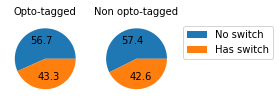

In [154]:
fig,axs=plt.subplots(1,2,figsize=(3,2))
ax=axs[0]
toplot=bd_rest_sw_count_sum_conttable[0]
ax.pie(toplot,autopct=lambda x:f'{x:.1f}')
ax.set_title('Opto-tagged')


ax=axs[1]
toplot=bd_rest_sw_count_sum_conttable[1]
ax.pie(toplot,autopct=lambda x:f'{x:.1f}')
ax.set_title('Non opto-tagged')

ax.legend(['No switch','Has switch'],bbox_to_anchor=[1.05,1])



figfn = 'switch_rate_vs_optotag'
ph.save_given_name(fig,figfn,figdir=figdir)


In [127]:
pd.DataFrame(bd_rest_sw_count_all)

e13_16f1                                                  \
          e13_16f1_210302 e13_16f1_210312 e13_16f1_210314 e13_16f1_210317   
n_bd                   11              11               9               9   
n_bd_sw                 5               3               2               1   
n_rest                 90              67              70              74   
n_rest_sw              42              25              28              22   

                                                                           \
          e13_16f1_210319 e13_16f1_210322 e13_16f1_210328 e13_16f1_210331   
n_bd                    6               9              27              24   
n_bd_sw                 2               5              15              11   
n_rest                 63              62             110              84   
n_rest_sw              24              33              42              24   

                 e13_26m1                  ...        e16_1f1                 \
          e13_26m1_210913 e13_26m1_211019  ... e16_1f1_200920 e16_1f1_200923   
n_bd                   32               4  ...              7              6   
n_bd_sw                23               4  ...              5              2   
n_rest                300             174  ...             39             34   
n_rest_sw             195              84  ...             18              4   

                                e16_2m1        e16_3m1                 \
          e16_1f1_201004 e16_2m1_201121 e16_3m1_210119 e16_3m1_210201   
n_bd                   6              4             12             11   
n_bd_sw                1              1              6              3   
n_rest                42             36             88            103   
n_rest_sw             20             10             38             34   

                                e16_3m2                                
          e16_3m1_210203 e16_3m2_211210 e16_3m2_211212 e16_3m2_211213  
n_bd                   3             12             12             25  
n_bd_sw                1              4              5             13  
n_rest               113            118            117            100  
n_rest_sw             33             50             58             49  

[4 rows x 46 columns]

In [59]:
bd_uid_pyr

array([ 13,  19,  24,  25,  28,  46,  47,  48,  55,  56,  63,  68,  72,
        74,  92,  93,  97, 101, 114, 115, 119, 121, 125, 187, 189, 196,
       204], dtype=uint8)

In [96]:
bd_rest_sw_count_all

{'n_bd': 25, 'n_bd_sw': 13, 'n_rest': 100, 'n_rest_sw': 49}

In [94]:
n_bd_pyr_rest

49

In [87]:
available_uid.shape[0]

125

In [88]:
rest_uid_pyr.shape

(100,)

In [89]:
n_rest

100

In [58]:
bd_uid_pyr

array([ 13,  19,  24,  25,  28,  46,  47,  48,  55,  56,  63,  68,  72,
        74,  92,  93,  97, 101, 114, 115, 119, 121, 125, 187, 189, 196,
       204], dtype=uint8)

In [55]:
bd_uid_pyr_avail

array([ 13,  19,  24,  25,  28,  46,  47,  48,  55,  56,  63,  68,  92,
        93,  97, 101, 114, 115, 119, 121, 125, 187, 189, 196, 204])

In [45]:
for (ani,sess),val in all_sw_d_all_fam.groupby(level=(0,1)):
    val.loc[ani,sess]['']

In [46]:
val.loc[(ani,sess)]

,trialtype,uid,field_index,time,speed_gauss,field_pos,trial_index,switch,index_within,switch_trial,switch_trial_frac,pre_ntrials_in_segment,post_ntrials_in_segment
0,1.0,117,0,7744.300833,12.697372,38.0,3,1.0,2,2.0,0.117647,2,4
1,both,127,0,7730.764067,10.343595,0.0,3,1.0,2,3.0,0.111111,3,3
2,1.0,14,2,7852.394900,20.236272,71.0,4,1.0,3,3.0,0.176471,3,8
3,1.0,26,1,7850.844500,15.304466,59.0,4,1.0,3,3.0,0.176471,3,3
4,1.0,59,3,7856.312550,4.816730,94.0,4,-1.0,3,3.0,0.176471,3,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...
101,0.0,103,1,9105.362400,9.214796,84.0,23,-1.0,7,7.0,0.700000,7,3
102,0.0,118,0,9022.391367,12.085282,11.0,23,1.0,7,7.0,0.700000,7,3
103,0.0,150,1,9104.345467,7.645985,80.0,23,1.0,7,7.0,0.700000,7,3
104,0.0,55,0,9192.884583,11.243111,86.0,24,-1.0,8,8.0,0.800000,8,2


In [18]:
val

trialtype  uid  field_index         time  \
e16_3m2 e16_3m2_211213 0         1.0  117            0  7744.300833   
                       1        both  127            0  7730.764067   
                       2         1.0   14            2  7852.394900   
                       3         1.0   26            1  7850.844500   
                       4         1.0   59            3  7856.312550   
...                              ...  ...          ...          ...   
                       101       0.0  103            1  9105.362400   
                       102       0.0  118            0  9022.391367   
                       103       0.0  150            1  9104.345467   
                       104       0.0   55            0  9192.884583   
                       105       0.0  142            0  9193.268000   

                            speed_gauss  field_pos  trial_index  switch  \
e16_3m2 e16_3m2_211213 0      12.697372       38.0            3     1.0   
                       1      10.343595        0.0            3     1.0   
                       2      20.236272       71.0            4     1.0   
                       3      15.304466       59.0            4     1.0   
                       4       4.816730       94.0            4    -1.0   
...                                 ...        ...          ...     ...   
                       101     9.214796       84.0           23    -1.0   
                       102    12.085282       11.0           23     1.0   
                       103     7.645985       80.0           23     1.0   
                       104    11.243111       86.0           24    -1.0   
                       105    16.621103       89.0           24     1.0   

                            index_within  switch_trial  switch_trial_frac  \
e16_3m2 e16_3m2_211213 0               2           2.0           0.117647   
                       1               2           3.0           0.111111   
                       2               3           3.0           0.176471   
                       3               3           3.0           0.176471   
                       4               3           3.0           0.176471   
...                                  ...           ...                ...   
                       101             7           7.0           0.700000   
                       102             7           7.0           0.700000   
                       103             7           7.0           0.700000   
                       104             8           8.0           0.800000   
                       105             8           8.0           0.800000   

                            pre_ntrials_in_segment  post_ntrials_in_segment  
e16_3m2 e16_3m2_211213 0                         2                        4  
                       1                         3                        3  
                       2                         3                        8  
                       3                         3                        3  
                       4                         3                       14  
...                                            ...                      ...  
                       101                       7                        3  
                       102                       7                        3  
                       103                       7                        3  
                       104                       8                        2  
                       105                       8                        2  

[106 rows x 13 columns]

In [42]:
opto_ma = np.logical_and(cell_metrics['optoTag']['p_salt']<0.001,cell_metrics['optoTag']['h_reliable'])

In [56]:
pyr_ma=np.array(['Pyr' in k for k in cell_metrics['putativeCellType']])
int_ma = np.array(['Int' in k for k in cell_metrics['putativeCellType']])
bd_uid_pyr = cell_metrics['UID'][pyr_ma&opto_ma]
bd_uid_int = cell_metrics['UID'][int_ma&opto_ma]

In [64]:
int_ma

array([ True, False, False, False, False, False,  True,  True,  True,
        True,  True,  True,  True,  True,  True, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False,  True,
       False, False, False,  True, False,  True, False, False, False])

In [63]:
bd_uid_int

array([ 1,  7,  8,  9, 10, 11, 14, 41, 45, 49, 51], dtype=uint8)

In [55]:
opto_ma
[cell_metrics['putativeCellType']]

[array(['Narrow Interneuron', 'Pyramidal Cell', 'Pyramidal Cell',
        'Pyramidal Cell', 'Pyramidal Cell', 'Pyramidal Cell',
        'Narrow Interneuron', 'Narrow Interneuron', 'Narrow Interneuron',
        'Narrow Interneuron', 'Narrow Interneuron', 'Narrow Interneuron',
        'Narrow Interneuron', 'Narrow Interneuron', 'Narrow Interneuron',
        'Pyramidal Cell', 'Pyramidal Cell', 'Narrow Interneuron',
        'Pyramidal Cell', 'Pyramidal Cell', 'Pyramidal Cell',
        'Pyramidal Cell', 'Pyramidal Cell', 'Pyramidal Cell',
        'Pyramidal Cell', 'Pyramidal Cell', 'Pyramidal Cell',
        'Pyramidal Cell', 'Pyramidal Cell', 'Pyramidal Cell',
        'Pyramidal Cell', 'Pyramidal Cell', 'Pyramidal Cell',
        'Pyramidal Cell', 'Pyramidal Cell', 'Pyramidal Cell',
        'Pyramidal Cell', 'Pyramidal Cell', 'Pyramidal Cell',
        'Pyramidal Cell', 'Narrow Interneuron', 'Pyramidal Cell',
        'Pyramidal Cell', 'Pyramidal Cell', 'Narrow Interneuron',
        'Pyramidal